Очистка датасета от ошибок в разметке

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2
import os
import tqdm

from torchvision import transforms
from hack_utils import *

np.random.seed(1234)

In [2]:
TEST_PREDICTIONS_FILENAME = "./share_10__test_predictions.pkl"
TRAIN_DATASET_FILENAME = "E:\\R\\made_cv_1\\data\\train"

CALC_MNAME = "share_10_"
#508cf47ac6a2f00fe95e6915be984fea.jpg
NUM_IMAGES_TO_SHOW = 32
NUM_COLS = 4
NUM_ROWS = NUM_IMAGES_TO_SHOW // NUM_COLS + int(NUM_IMAGES_TO_SHOW % NUM_COLS != 0)

batch_size = 512 

In [3]:
def draw_landmarks(image, landmarks):
    for point in landmarks:
        x, y = point.astype(np.int)
        cv2.circle(image, (x, y), 1, (128, 0, 128), 1, -1)
    return image

In [4]:
with open(TEST_PREDICTIONS_FILENAME, "rb") as fp:
    results = pickle.load(fp)
image_names = results["image_names"]
landmarks = results["landmarks"]

print("Images:", len(image_names))
print("Landmarks shape:", landmarks.shape)

if len(image_names) < NUM_IMAGES_TO_SHOW:
    raise RuntimeError(f"Choose less images to show, you have only {len(image_names)}")

Images: 99819
Landmarks shape: (99819, 971, 2)


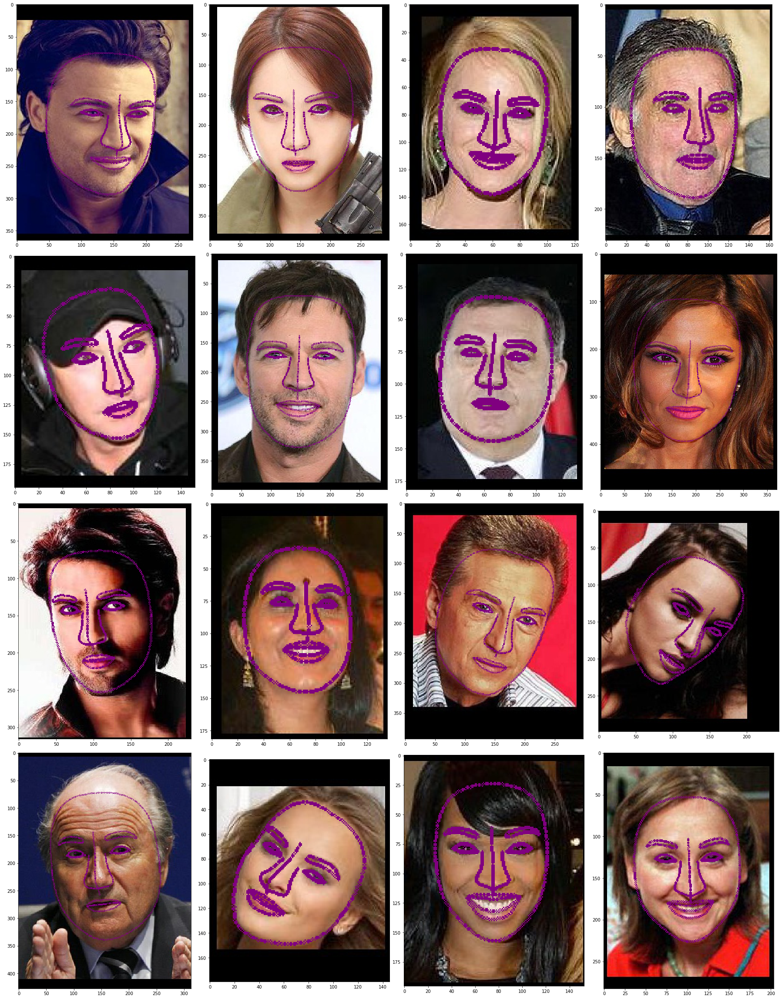

In [5]:
random_idxs = np.random.choice(len(image_names), size=min(NUM_IMAGES_TO_SHOW, len(image_names)), replace=False)

plt.figure(figsize=(25, NUM_ROWS * 8))
for i, idx in enumerate(random_idxs, 1):
    image = cv2.imread(image_names[idx])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = draw_landmarks(image, landmarks[idx])
    
    plt.subplot(NUM_ROWS, NUM_COLS, i)
    plt.imshow(image)

plt.tight_layout()
plt.show()

### Проверка пресказания

Загружаем трейн и обученную модель

In [4]:

train_transforms = transforms.Compose([
    ScaleMinSideToSize((CROP_SIZE, CROP_SIZE)),
    CropCenter(CROP_SIZE),
    TransformByKeys(transforms.ToPILImage(), ("image",)),
    TransformByKeys(transforms.ToTensor(), ("image",)),
    TransformByKeys(transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]), ("image",)),
])

val_dataset = ThousandLandmarksDataset(TRAIN_DATASET_FILENAME, train_transforms, split="all_train")
val_dataloader = data.DataLoader(val_dataset, batch_size=batch_size, num_workers=4, pin_memory=True,
                                 shuffle=False, drop_last=False)


with open(f"{CALC_MNAME}_step.pth", "rb") as fp:
        model = torch.load(fp)
        

Делаем прогноз по всем картинкам

In [5]:
def predict(model, loader, device):
    model.eval()
    predictions = np.zeros((len(loader.dataset), NUM_PTS, 2))
    for i, batch in enumerate(tqdm.tqdm(loader, total=len(loader), desc="test prediction...")):
        images = batch["image"].to(device)

        with torch.no_grad():
            pred_landmarks = model(images).cpu()
        pred_landmarks = pred_landmarks.numpy().reshape((len(pred_landmarks), NUM_PTS, 2))  # B x NUM_PTS x 2

        fs = batch["scale_coef"].numpy()  # B
        margins_x = batch["crop_margin_x"].numpy()  # B
        margins_y = batch["crop_margin_y"].numpy()  # B
        prediction = restore_landmarks_batch(pred_landmarks, fs, margins_x, margins_y)  # B x NUM_PTS x 2
        predictions[i * loader.batch_size: (i + 1) * loader.batch_size] = prediction

    return predictions

device = torch.device("cpu")
val_predictions = predict(model, val_dataloader, device) 

test prediction...: 100%|██████████████████████████████████████████████████████████| 489/489 [1:22:48<00:00, 10.16s/it]


Загружаем исходную разметку

In [6]:
%time
df = pd.read_csv(TRAIN_DATASET_FILENAME + '\\landmarks.csv',  delimiter='\t')
%timeit

Wall time: 0 ns


In [7]:
%time
df = pd.read_pickle(TRAIN_DATASET_FILENAME + '\\landmarks.pkl')
%timeit

Wall time: 0 ns


In [7]:
image_names = val_dataset.image_names
landmarks = val_predictions

real_landmarks = val_dataset.landmarks.numpy()
print("Images:", len(image_names))
print("Landmarks shape:", landmarks.shape)

if len(image_names) < NUM_IMAGES_TO_SHOW:
    raise RuntimeError(f"Choose less images to show, you have only {len(image_names)}")

Images: 250121
Landmarks shape: (250121, 971, 2)


In [8]:
def draw_landmarks_full(image, landmarks, color):
    for point in landmarks:
        x, y = point.astype(np.int)
        cv2.circle(image, (x, y), 1, color, 1, -1)
    return image

In [9]:
np.sum(np.abs( np.sum((landmarks - real_landmarks) , axis = (1)) ), axis = (1)).shape

(250121,)

Считаем ошибки

Средняя ошибка:2.00 среднее смещение:0.42


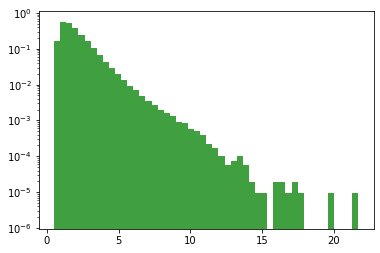

In [10]:
errors = np.sqrt(np.sum(abs(landmarks - real_landmarks) * abs(landmarks - real_landmarks), axis = (1, 2)) / 971 / 2)
delta_errors = np.sum(np.abs( np.sum((landmarks - real_landmarks) , axis = (1)) ), axis = (1)) / 971 / 2

print("Средняя ошибка:{:2.2f} среднее смещение:{:2.2f}".format(np.mean(errors), np.mean(delta_errors)))
plt.hist(errors, 50, density=True, histtype='stepfilled', facecolor='g',alpha=0.75, log = True)
plt.show()

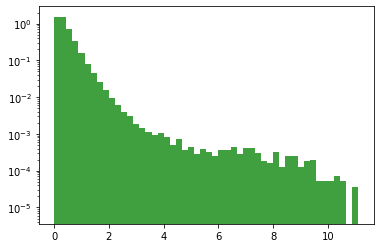

In [11]:
plt.hist(delta_errors, 50, density=True, histtype='stepfilled', facecolor='g',alpha=0.75, log = True)
plt.show()

In [12]:
errors

array([2.62851978, 1.74126338, 2.76933   , ..., 2.11549247, 2.17225343,
       2.07794816])

In [13]:
delta_errors

array([0.5573059 , 0.34398563, 0.41489625, ..., 0.34441575, 0.76296021,
       0.24404372])

In [14]:
errors[(errors > 10) & (delta_errors > 10)].shape

(12,)

In [21]:
# Индексы примеров с большими ошибками
index_errors = np.where((errors > 3.5) & (delta_errors > 6) & (delta_errors < 6.5))[0]
index_errors.shape

(47,)

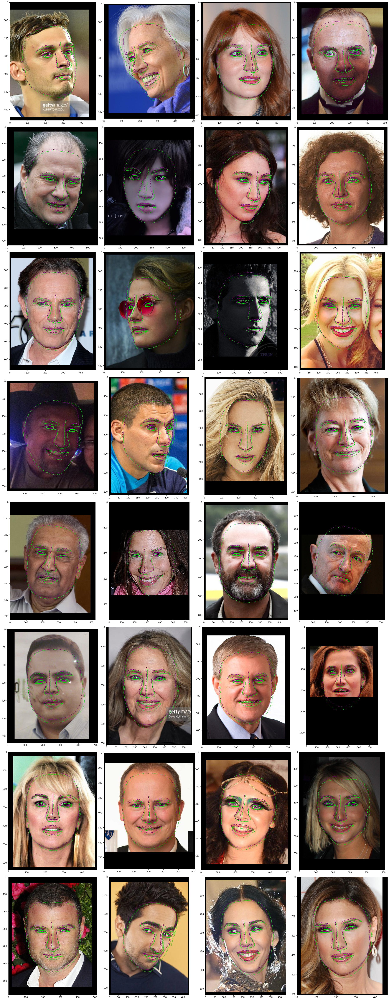

In [22]:
random_idxs = np.random.choice(len(index_errors), size=min(NUM_IMAGES_TO_SHOW, len(index_errors)), replace=False)

plt.figure(figsize=(25, NUM_ROWS * 8))
for i, idx_temp in enumerate(random_idxs, 1):
    idx = index_errors[idx_temp]
    image = cv2.imread(image_names[idx])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = draw_landmarks_full(image, landmarks[idx], (128, 0, 128))
    image = draw_landmarks_full(image, real_landmarks[idx], (0, 220, 0))
    
    plt.subplot(NUM_ROWS, NUM_COLS, i)
    plt.imshow(image)
    #print("{} {:3.1f}  {:3.1f}".format(i, errors[idx], delta_errors[idx]))

plt.tight_layout()
plt.show()

In [23]:
index_not_errors = np.where((errors < 4) | (delta_errors < 6))[0]

print("Все ошибка:{:2.2f}  смещение:{:2.2f}".format(np.mean(errors), np.mean(delta_errors)))
print("Без крупных ошибка:{:2.2f}  смещение:{:2.2f}".format(np.mean(errors[index_not_errors]), 
                                                            np.mean(delta_errors[index_not_errors])))

Все ошибка:2.00  смещение:0.42
Без крупных ошибка:1.99  смещение:0.41


Сохраняем разметку без больших ошибок

In [24]:
%time
df.loc[index_not_errors,:].to_csv(TRAIN_DATASET_FILENAME + '\\landmarks.csv',  sep='\t', index = False)
%timeit

Wall time: 0 ns


In [107]:
%time
df1 = pd.read_csv(TRAIN_DATASET_FILENAME + '\\landmarks.csv',  delimiter='\t')
df1.head()
%timeit

Wall time: 0 ns
